In [1]:
import pandas as pd
import numpy as np
import datetime, re
from datetime import datetime, time
import matplotlib as mpl
from matplotlib.colors import ListedColormap
import plotly.express as px
import math

## Call Data
Dataframe with calls imported from First Due

In [2]:
# calls from the previous six months
path = "DisptchItemsSearchResult.csv"

In [3]:
df = pd.read_csv(path)
df

,XREF ID,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,FULL MESSAGE,MESSAGE,CREATE DATE
0,2.300011e+09,TAC1,"375 MAIN ST, DANBURY, CT, 06810",UNK PROBLEM / MAN DOWN DELTA,375 MAIN ST,DANBURY,A2 BLS\r\n\r\nPOSS DRUG USE\r\n\r\nMALE PARTY ...,A2 BLS\r\n\r\nPOSS DRUG USE\r\n\r\nMALE PARTY ...,2023-12-31 22:20
1,2.300011e+09,E25,"12 MENDES RD, DANBURY, CT, 06811",UNCONSCIOUS / FAINTING DELTA,12 MENDES RD,DANBURY,"A3 ALS\r\n\r\nPOSS DIABETIC ISSUE, HE IS TYPE ...","A3 ALS\r\n\r\nPOSS DIABETIC ISSUE, HE IS TYPE ...",2023-12-31 21:47
2,2.300011e+09,TAC1,"9 GOLDEN HILL LN, DANBURY, CT, 06811",STROKE / TIA DELTA,9 GOLDEN HILL LN,DANBURY,A1 ALS\r\n\r\nFirst Patient Contact at 2023-12...,A1 ALS\r\n\r\nFirst Patient Contact at 2023-12...,2023-12-31 21:44
3,2.300011e+09,E22,"36 W WOOSTER ST, DANBURY, CT, 06810",FIRE ALARM - COMMERCIAL,36 W WOOSTER ST,DANBURY,ALARM HAS BEEN RESET ALL UNITS CLEAR\r\n\r\n7 ...,ALARM HAS BEEN RESET ALL UNITS CLEAR\r\n\r\n7 ...,2023-12-31 18:15
4,2.300011e+09,SQ21,NaN,MEDICAL ALERT - WITH FD,25 MEMORIAL DR,DANBURY,OP NUMBER 36048 \r\nREFERENCE NUMBER SAME AS O...,OP NUMBER 36048 \r\nREFERENCE NUMBER SAME AS O...,2023-12-31 18:13
...,...,...,...,...,...,...,...,...,...
6398,2.300003e+09,FPH3,NaN,FIRE ALARM SERVICE/TEST,2 NATIONAL PL,DANBURY,WILL CALL WHEN DONE,WILL CALL WHEN DONE,2023-04-25 13:41
6399,2.300003e+09,TAC1,NaN,MEDICAL ALERT,25 MEMORIAL DR,DANBURY,NO ISSUE\r\n\r\nREFERENCE 70216\r\n\r\nNO PT N...,NO ISSUE\r\n\r\nREFERENCE 70216\r\n\r\nNO PT N...,2023-04-25 13:39
6400,2.300003e+09,FPH2,NaN,FIRE ALARM SERVICE/TEST,107 OSBORNE ST,DANBURY,RAPID RESPONSE TEST,RAPID RESPONSE TEST,2023-04-25 13:35
6401,2.300003e+09,E24,NaN,FIRE ALARM - RESIDENTIAL,28 CORN TASSLE RD,DANBURY,HOMEOWNER SAID ISSUE WITH THE ALARM. BEEN HAPP...,HOMEOWNER SAID ISSUE WITH THE ALARM. BEEN HAPP...,2023-04-25 13:14


In [4]:
df[df.TYPE.str.contains('MUTUAL AID')]

,XREF ID,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,FULL MESSAGE,MESSAGE,CREATE DATE
617,2.300011e+09,SQ6,NaN,FIRE - MUTUAL AID OUT OF CITY,208 GREENWOOD AVE,BETHEL,"FIRE HAS BEEN KNOCKED DOWN, DANBURY COMPANIES ...","FIRE HAS BEEN KNOCKED DOWN, DANBURY COMPANIES ...",2023-12-10 10:41
1444,2.300010e+09,C30,NaN,FIRE - MUTUAL AID OUT OF CITY,54 GILLOTTI RD,NEW FAIRFIELD,NO NEED FOR VENTING \r\nALL UNITS IN SERVICE\r...,NO NEED FOR VENTING \r\nALL UNITS IN SERVICE\r...,2023-11-06 05:54
1591,2.300009e+09,E24,NaN,FIRE - MUTUAL AID OUT OF CITY,Baldwin Hill RD/Ironworks Hill RD,Brookfield,NaN,NaN,2023-10-30 14:21
1592,2.300009e+09,C30,NaN,FIRE - MUTUAL AID OUT OF CITY,9 EVAS DR,BROOKFIELD,E24 WILL BE IN SERVICE 5-10 MIN\r\n\r\nUNITS C...,E24 WILL BE IN SERVICE 5-10 MIN\r\n\r\nUNITS C...,2023-10-30 13:45
2987,2.300008e+09,"C30, E24, T1","246 FEDERAL RD, BROOKFIELD, CT, 06804",FIRE - MUTUAL AID OUT OF CITY,246 FEDERAL RD,BROOKFIELD,"CANCEL RESPONSE PER BROOKFIELD, THEY CAN HANDL...","CANCEL RESPONSE PER BROOKFIELD, THEY CAN HANDL...",2023-09-06 19:29
3317,2.300007e+09,C61,NaN,FIRE - MUTUAL AID OUT OF CITY,49 OWN HOME AVE,WILTON,CAR 61 ASSISTED WILTON PD W/ FD DRONE REQUEST ...,CAR 61 ASSISTED WILTON PD W/ FD DRONE REQUEST ...,2023-08-23 19:10
3737,2.300007e+09,"C30, C61",NaN,FIRE - MUTUAL AID OUT OF CITY,4 N STAR DR,NEW FAIRFIELD,RESCUE ASSIGMENT,RESCUE ASSIGMENT,2023-08-05 20:20
3977,2.300006e+09,"C30, E24",NaN,FIRE - MUTUAL AID OUT OF CITY,8 GALLOWS RD,BROOKFIELD,CANCELLED ENROUTE BY BROOKFIELD\r\n\r\n8 GALLO...,CANCELLED ENROUTE BY BROOKFIELD\r\n\r\n8 GALLO...,2023-07-26 13:50
4406,2.300006e+09,E27,NaN,FIRE - MUTUAL AID OUT OF CITY,424 MAIN ST,RIDGEFIELD,AFA\r\nDISPATCHED 17:23\r\nENROUTE 17:25\r\nAR...,AFA\r\nDISPATCHED 17:23\r\nENROUTE 17:25\r\nAR...,2023-07-11 18:57
4407,2.300006e+09,E27,NaN,FIRE - MUTUAL AID OUT OF CITY,12 CLEARVIEW DR,RIDGEFIELD,INVESTIGATION\r\nDISPATCHED 15:04\r\nENROUTE 1...,INVESTIGATION\r\nDISPATCHED 15:04\r\nENROUTE 1...,2023-07-11 18:51


#### LOCATIONS AND CALL TYPES
I would like to develop some visualizations to show amounts and locations of call types. The data would need to be cleaned up a bit, and drilled into, to get the appropriate information

In [5]:
call_types = df.TYPE.unique().tolist()
call_types[:20]

['UNK PROBLEM / MAN DOWN DELTA',
 'UNCONSCIOUS / FAINTING DELTA',
 'STROKE  / TIA DELTA',
 'FIRE ALARM - COMMERCIAL',
 'MEDICAL ALERT - WITH FD',
 'BREATHING PROBLEMS DELTA',
 'FALLS BRAVO',
 'FIRE - VEHICLE',
 'SICK PERSON (SPECIFIC) DELTA',
 'GAS LEAK 2 - INSIDE STRUCTURE',
 'INVESTIGATION FD',
 'LOCK IN',
 'MEDICAL ALERT - NO FD',
 'FIRE ALARM - INVESTIGATION',
 'CARDIAC / RESP ARREST DELTA',
 'HEART PROBLEM DELTA',
 'CHEST PAIN DELTA',
 'CONVULSIONS / SEIZURES DELTA',
 'MVA W INJ CHARLIE',
 'MVA W INJ DELTA']

In [6]:
df[df.TYPE.str.contains('MEDICAL ALERT - NO FD')]

,XREF ID,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,FULL MESSAGE,MESSAGE,CREATE DATE
23,2.300011e+09,E23,"22 CLEVELAND ST, DANBURY, CT, 06810",MEDICAL ALERT - NO FD,22 CLEVELAND ST,DANBURY,LOCK BOX CODE: 1967\r\n\r\nLINA: 203-648-8139\...,LOCK BOX CODE: 1967\r\n\r\nLINA: 203-648-8139\...,2023-12-31 06:26
147,2.300011e+09,TAC1,NaN,MEDICAL ALERT - NO FD,6 HIGH ST EXT,DANBURY,TAC TAKING MEDIC VEHICLE TO HOSP\r\n\r\nLOCK B...,TAC TAKING MEDIC VEHICLE TO HOSP\r\n\r\nLOCK B...,2023-12-26 14:39
233,2.300011e+09,SQ21,NaN,MEDICAL ALERT - NO FD,51 MAIN ST,DANBURY,REF# 7450028\r\n\r\nDOOR IS UNLOCKED \r\n\r\nS...,REF# 7450028\r\n\r\nDOOR IS UNLOCKED \r\n\r\nS...,2023-12-23 10:18
485,2.300011e+09,SQ21,"88 MAIN ST, DANBURY, CT, 06810",MEDICAL ALERT - NO FD,88 MAIN ST,DANBURY,CARE GIVER IS O/S\r\n\r\n96 Y/O/F FEVER SWOLLE...,CARE GIVER IS O/S\r\n\r\n96 Y/O/F FEVER SWOLLE...,2023-12-15 19:14
527,2.300011e+09,SQ21,NaN,MEDICAL ALERT - NO FD,40 WILLIAM ST,DANBURY,First Patient Contact at 2023-12-14 03:14:13\r...,First Patient Contact at 2023-12-14 03:14:13\r...,2023-12-14 03:06
590,2.300011e+09,E22,"36 JEFFERSON AVE, DANBURY, CT, 06810",MEDICAL ALERT - NO FD,36 JEFFERSON AVE,DANBURY,MEDICAL INFO ON FRIDGE\r\n\r\nPP# 203 743 0333...,MEDICAL INFO ON FRIDGE\r\n\r\nPP# 203 743 0333...,2023-12-11 15:20
1123,2.300010e+09,E23,NaN,MEDICAL ALERT - NO FD,10 HAYESTOWN RD,DANBURY,A1 CLEARED RMA/LIFT ASSIST\r\n\r\nFirst Patien...,A1 CLEARED RMA/LIFT ASSIST\r\n\r\nFirst Patien...,2023-11-19 03:24
1350,2.300010e+09,T1,NaN,MEDICAL ALERT - NO FD,40 WILLIAM ST,DANBURY,"DOOR UNLOCKED, NO INJ, LIFT ASSIT \r\n\r\nDOUG...","DOOR UNLOCKED, NO INJ, LIFT ASSIT \r\n\r\nDOUG...",2023-11-10 02:49
1662,2.300009e+09,E26,NaN,MEDICAL ALERT - NO FD,33 ABBEY LN,DANBURY,LOCK BOX CODE: 4770\r\n\r\nCall Type Changed/E...,LOCK BOX CODE: 4770\r\n\r\nCall Type Changed/E...,2023-10-28 05:51
1744,2.300009e+09,E23,NaN,MEDICAL ALERT - NO FD,3 GLEN HILL RD,DANBURY,PREM 914-319-0515\r\n\r\nBARBARA VERZI\r\n\r\n...,PREM 914-319-0515\r\n\r\nBARBARA VERZI\r\n\r\n...,2023-10-25 10:54


#### Getting Rid of Call Types
There are several call types that are irrelevant. These call types are either a mistake, no-response call types, or unnecessary call types. Also eliminating 'COVER ASSIGNMENTS' as they are either Volunteer oriented, or a company is re assigned because of other ongoing emergency calls.

In [7]:
# eliminate the following call types:
removed_call_type = ['MEDICAL ALERT - NO FD', 'ALARM BURGLARY', 'POLICE INFORMATION',\
                     'FIRE WATCH', 'COVER ASSIGNMENT', 'EMERGENCY HIRE BACK',\
                     'PROQA MEDICAL LAUNCH', 'FIRE ALARM SERVICE/TEST', 'FIRE - INFO ONLY',\
                     'FIRE ALARM DRILL', 'FIRE TEST CALL', 'CARDIAC / RESP ARREST - EMD',\
                     'MVA W INJ - EMD', 'CI / BEHAVIOR  - EMD IP', 'UNK PROBLEM / MAN DOWN - EMD',\
                     'DRUG OD/ACDNT INGESTION - EMD', 'BREATHING PROBLEMS - EMD', 'SICK PERSON (SPECIFIC) - EMD IP',\
                     'HEART PROBLEM - EMD IP', 'CHEST PAIN - EMD IP', 'FALLS - EMD IP',\
                     'UNCONSCIOUS / FAINTING - EMD', 'TRAUMA (SPECIFIC) - EMD', 'SEIZURES - EMD IP',\
                     'DIABETIC PROB - EMD IP','CONFINED SPACE ENTRY']

rem_call_df = df[df.TYPE.isin(removed_call_type)]

df1 = df[~df.TYPE.isin(removed_call_type)].copy()

print('Number of calls minus removed calls: ',len(df)-len(rem_call_df),'\nNumber of calls in updated dataframe: ',len(df1))
df1.reset_index(drop=True,inplace=True)

Number of calls minus removed calls:  6082 
Number of calls in updated dataframe:  6082


In [8]:
df1.drop(columns=['XREF ID','FULL MESSAGE','MESSAGE'],inplace=True)

corrected = pd.Series(df1['INITIAL ADDRESS'].apply(lambda x: ' '.join(x.split())),name='INITIAL ADDRESS').tolist()
original = df1['INITIAL ADDRESS'].tolist()

mapper = {x:y for x,y in zip(original,corrected)}

df1['INITIAL ADDRESS'].replace(mapper,inplace=True)
df1

,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,CREATE DATE
0,TAC1,"375 MAIN ST, DANBURY, CT, 06810",UNK PROBLEM / MAN DOWN DELTA,375 MAIN ST,DANBURY,2023-12-31 22:20
1,E25,"12 MENDES RD, DANBURY, CT, 06811",UNCONSCIOUS / FAINTING DELTA,12 MENDES RD,DANBURY,2023-12-31 21:47
2,TAC1,"9 GOLDEN HILL LN, DANBURY, CT, 06811",STROKE / TIA DELTA,9 GOLDEN HILL LN,DANBURY,2023-12-31 21:44
3,E22,"36 W WOOSTER ST, DANBURY, CT, 06810",FIRE ALARM - COMMERCIAL,36 W WOOSTER ST,DANBURY,2023-12-31 18:15
4,SQ21,NaN,MEDICAL ALERT - WITH FD,25 MEMORIAL DR,DANBURY,2023-12-31 18:13
...,...,...,...,...,...,...
6077,TAC1,NaN,CHEST PAIN DELTA,33 TOWN HILL AVE,DANBURY,2023-04-25 13:59
6078,E26,NaN,SICK PERSON (SPECIFIC) BRAVO,33 ABBEY LN,DANBURY,2023-04-25 13:52
6079,TAC1,NaN,MEDICAL ALERT,25 MEMORIAL DR,DANBURY,2023-04-25 13:39
6080,E24,NaN,FIRE ALARM - RESIDENTIAL,28 CORN TASSLE RD,DANBURY,2023-04-25 13:14


In [9]:
freq_address = df1['INITIAL ADDRESS'].value_counts()[df1['INITIAL ADDRESS'].value_counts()>6]
freq_address

25 MEMORIAL DR           81
7 BACKUS AVE             80
66 WOOSTER HEIGHTS RD    62
E I84 HWY                55
33.5 PEMBROKE RD         55
                         ..
98 NEWTOWN RD             7
210 MAIN ST               7
8 DELAY ST                7
NATIONAL PL/WHITE ST      7
10 CLAPBOARD RIDGE RD     7
Name: INITIAL ADDRESS, Length: 118, dtype: int64

In [10]:
def graph_colors(df_graph_category,len_df_category,color='red'):
    
    red = px.colors.n_colors('rgb(255,0,0)','rgb(.001,0,255)',len_df_category,colortype='rgb')
    blue = px.colors.n_colors('rgb(0,0,255)','rgb(255,0,.001)',len_df_category,colortype='rgb')
    green = px.colors.n_colors('rgb(0,255,0)','rgb(0,.001,255)',len_df_category,colortype='rgb')
    yellow = px.colors.n_colors('rgb(255,255,0)','rgb(255,.001,0)',len_df_category,colortype='rgb')
    
    color_list = {'red':red,'blue':blue,'green':green,'yellow':yellow}
    
    mapper = {x:y for x,y in zip(df_graph_category,color_list[color])}
    return mapper

In [11]:
len(df1.TYPE.unique())

110

Develop a color map to help with the visualizations. Such as assigning a color spectrum for call types on frequently visited addresses.

In [12]:
mapper = {x:y for x,y in zip(df1.TYPE.unique().tolist(),px.colors.n_colors('rgb(0,255,0)',
                                                                  'rgb(255,255,.001)',
                                                                  107,
                                                                  colortype='rgb'))}                             
mapper

{'UNK PROBLEM / MAN DOWN DELTA': 'rgb(0.0, 255.0, 0.0)',
 'UNCONSCIOUS / FAINTING DELTA': 'rgb(2.4056603773584904, 255.0, 9.433962264150944e-06)',
 'STROKE  / TIA DELTA': 'rgb(4.811320754716981, 255.0, 1.8867924528301888e-05)',
 'FIRE ALARM - COMMERCIAL': 'rgb(7.216981132075471, 255.0, 2.830188679245283e-05)',
 'MEDICAL ALERT - WITH FD': 'rgb(9.622641509433961, 255.0, 3.7735849056603776e-05)',
 'BREATHING PROBLEMS DELTA': 'rgb(12.028301886792452, 255.0, 4.716981132075472e-05)',
 'FALLS BRAVO': 'rgb(14.433962264150942, 255.0, 5.660377358490566e-05)',
 'FIRE - VEHICLE': 'rgb(16.839622641509433, 255.0, 6.60377358490566e-05)',
 'SICK PERSON (SPECIFIC) DELTA': 'rgb(19.245283018867923, 255.0, 7.547169811320755e-05)',
 'GAS LEAK 2 - INSIDE STRUCTURE': 'rgb(21.650943396226413, 255.0, 8.49056603773585e-05)',
 'INVESTIGATION FD': 'rgb(24.056603773584904, 255.0, 9.433962264150944e-05)',
 'LOCK IN': 'rgb(26.462264150943394, 255.0, 0.00010377358490566039)',
 'FIRE ALARM - INVESTIGATION': 'rgb(28.86

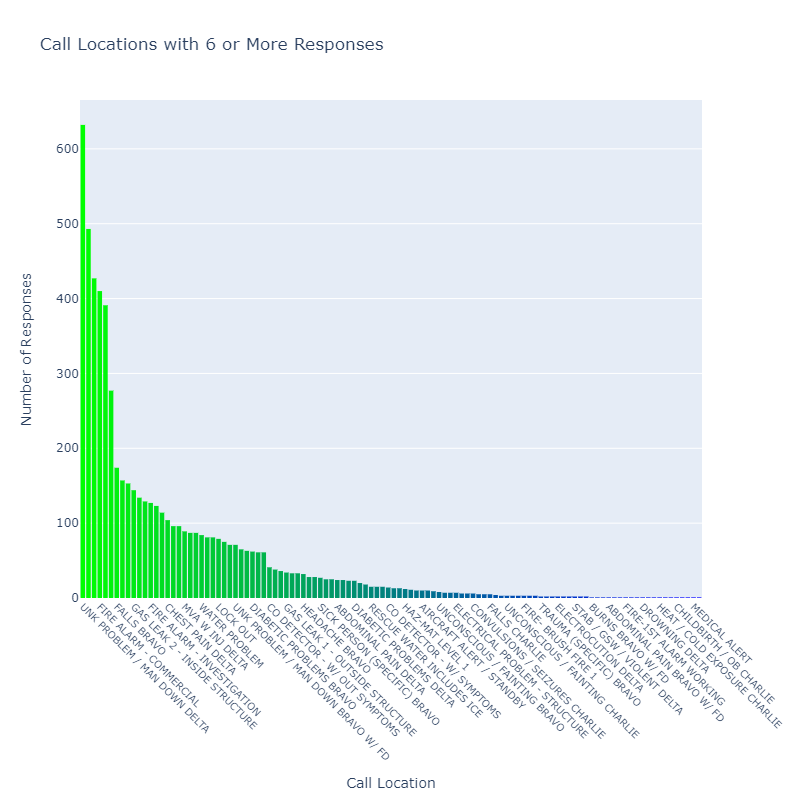

In [13]:
mapper = graph_colors(df1.TYPE.unique().tolist(),len(df1.TYPE.unique()),color='green')

freq_address_bar = px.histogram(df1,
                                x=df1.TYPE.unique(),
                                y=df1.TYPE.value_counts(),
                                color=df1.TYPE.unique(),
                                color_discrete_map=mapper,
                                title="Call Locations with 6 or More Responses",
                                height=800,
                                width=1600)
freq_address_bar.update_layout(yaxis_title='Number of Responses',
                               xaxis_title='Call Location',
                               showlegend=False)
freq_address_bar.update_xaxes(tickangle=45,
                             tickfont={'size':10})


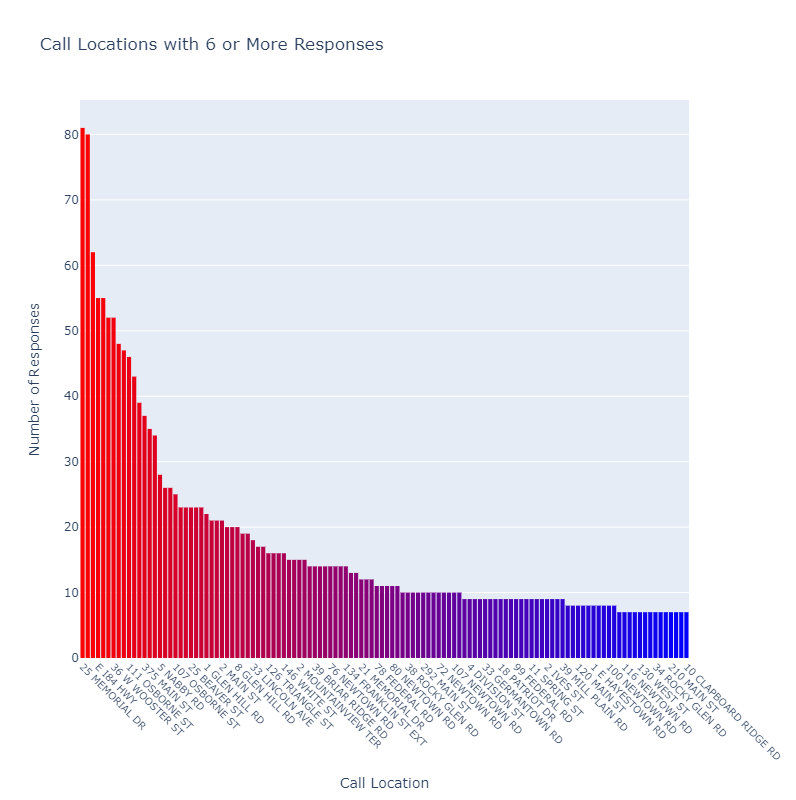

In [14]:
freq_address_bar = px.histogram(freq_address,
                                x=freq_address.index,
                                y=freq_address,
                                color=freq_address.index,
                                color_discrete_map=graph_colors(freq_address.index,len(freq_address.index)),
                                title="Call Locations with 6 or More Responses",
                                height=800,
                                width=1600)
freq_address_bar.update_layout(yaxis_title='Number of Responses',
                               xaxis_title='Call Location',
                               showlegend=False)
freq_address_bar.update_xaxes(tickangle=45,
                             tickfont={'size':10})

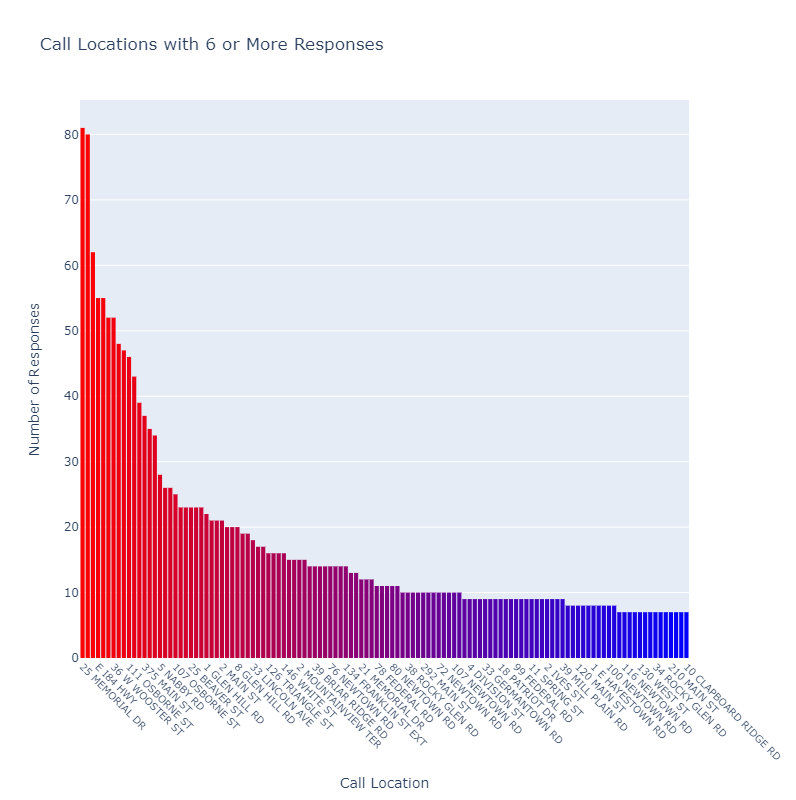

In [15]:


freq_address_bar = px.histogram(freq_address,
                                x=freq_address.index,
                                y=freq_address,
                                color=freq_address.index,
                                color_discrete_map=graph_colors(freq_address.index,len(freq_address.index)),
                                title="Call Locations with 6 or More Responses",
                                height=800,
                                width=1600)
freq_address_bar.update_layout(yaxis_title='Number of Responses',
                               xaxis_title='Call Location',
                               showlegend=False)
freq_address_bar.update_xaxes(tickangle=45,
                             tickfont={'size':10})

In [16]:
memorial_dr = df1[df1['INITIAL ADDRESS'].str.contains('25 MEMORIAL DR')]
print(len(memorial_dr))

81


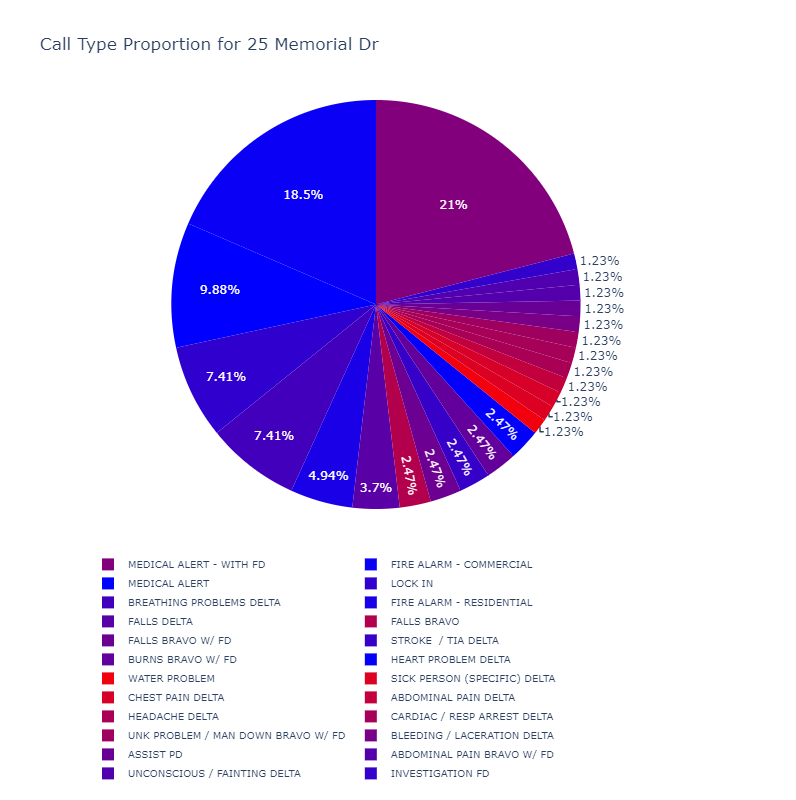

In [17]:
memorial_dr_pie = px.pie(memorial_dr,names='TYPE',
                         color='TYPE',
                         color_discrete_map=graph_colors(memorial_dr.TYPE.tolist(),len(memorial_dr.TYPE)),
                         title='Call Type Proportion for 25 Memorial Dr',
                         height=800,
                         width=800)
memorial_dr_pie.update_layout(legend_font=dict(size=10),
                             legend_orientation='h')


#### TIME
There is also a lot of data to be gleaned and used based on the time of day and time of year certain calls happen, and don't happen.

In [18]:
datetime.fromisoformat(df1['CREATE DATE'].iloc[0])

datetime.datetime(2023, 12, 31, 22, 20)

In [19]:
type(datetime.fromisoformat(df1['CREATE DATE'].iloc[0]))

datetime.datetime

In [20]:
from datetime import time,date

In [21]:
date.fromisoformat(df1['CREATE DATE'].iloc[0][:-6])

datetime.date(2023, 12, 31)

In [22]:
time.fromisoformat(df1['CREATE DATE'].iloc[0][-5:])

datetime.time(22, 20)

In [23]:
call_times = df1[['TYPE', 'CREATE DATE']].copy()
call_times

,TYPE,CREATE DATE
0,UNK PROBLEM / MAN DOWN DELTA,2023-12-31 22:20
1,UNCONSCIOUS / FAINTING DELTA,2023-12-31 21:47
2,STROKE / TIA DELTA,2023-12-31 21:44
3,FIRE ALARM - COMMERCIAL,2023-12-31 18:15
4,MEDICAL ALERT - WITH FD,2023-12-31 18:13
...,...,...
6077,CHEST PAIN DELTA,2023-04-25 13:59
6078,SICK PERSON (SPECIFIC) BRAVO,2023-04-25 13:52
6079,MEDICAL ALERT,2023-04-25 13:39
6080,FIRE ALARM - RESIDENTIAL,2023-04-25 13:14


In [24]:
df1[df1['CREATE DATE']>'2023-10-01 00:00']

,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,CREATE DATE
0,TAC1,"375 MAIN ST, DANBURY, CT, 06810",UNK PROBLEM / MAN DOWN DELTA,375 MAIN ST,DANBURY,2023-12-31 22:20
1,E25,"12 MENDES RD, DANBURY, CT, 06811",UNCONSCIOUS / FAINTING DELTA,12 MENDES RD,DANBURY,2023-12-31 21:47
2,TAC1,"9 GOLDEN HILL LN, DANBURY, CT, 06811",STROKE / TIA DELTA,9 GOLDEN HILL LN,DANBURY,2023-12-31 21:44
3,E22,"36 W WOOSTER ST, DANBURY, CT, 06810",FIRE ALARM - COMMERCIAL,36 W WOOSTER ST,DANBURY,2023-12-31 18:15
4,SQ21,NaN,MEDICAL ALERT - WITH FD,25 MEMORIAL DR,DANBURY,2023-12-31 18:13
...,...,...,...,...,...,...
2293,E24,NaN,SICK PERSON (SPECIFIC) BRAVO,2 MOUNTAINVIEW TER,DANBURY,2023-10-01 08:04
2294,R1,NaN,BREATHING PROBLEMS DELTA,19 MAIN ST,DANBURY,2023-10-01 04:53
2295,E26,"15 MILESTONE RD, DANBURY, CT, 06810",DRUG OD/ACDNT INGESTION DELTA,15 MILESTONE RD,DANBURY,2023-10-01 04:09
2296,TAC1,NaN,CHOKING DELTA,6 DELAY ST,DANBURY,2023-10-01 02:02


In [25]:
call_times['DATE'] = [call_times['CREATE DATE'].iloc[x][:-6] for x in range(len(call_times))]


In [26]:
call_times

,TYPE,CREATE DATE,DATE
0,UNK PROBLEM / MAN DOWN DELTA,2023-12-31 22:20,2023-12-31
1,UNCONSCIOUS / FAINTING DELTA,2023-12-31 21:47,2023-12-31
2,STROKE / TIA DELTA,2023-12-31 21:44,2023-12-31
3,FIRE ALARM - COMMERCIAL,2023-12-31 18:15,2023-12-31
4,MEDICAL ALERT - WITH FD,2023-12-31 18:13,2023-12-31
...,...,...,...
6077,CHEST PAIN DELTA,2023-04-25 13:59,2023-04-25
6078,SICK PERSON (SPECIFIC) BRAVO,2023-04-25 13:52,2023-04-25
6079,MEDICAL ALERT,2023-04-25 13:39,2023-04-25
6080,FIRE ALARM - RESIDENTIAL,2023-04-25 13:14,2023-04-25


In [27]:
call_times['TIME'] = [call_times['CREATE DATE'].iloc[x][-5:] for x in range(len(call_times))]
call_times

,TYPE,CREATE DATE,DATE,TIME
0,UNK PROBLEM / MAN DOWN DELTA,2023-12-31 22:20,2023-12-31,22:20
1,UNCONSCIOUS / FAINTING DELTA,2023-12-31 21:47,2023-12-31,21:47
2,STROKE / TIA DELTA,2023-12-31 21:44,2023-12-31,21:44
3,FIRE ALARM - COMMERCIAL,2023-12-31 18:15,2023-12-31,18:15
4,MEDICAL ALERT - WITH FD,2023-12-31 18:13,2023-12-31,18:13
...,...,...,...,...
6077,CHEST PAIN DELTA,2023-04-25 13:59,2023-04-25,13:59
6078,SICK PERSON (SPECIFIC) BRAVO,2023-04-25 13:52,2023-04-25,13:52
6079,MEDICAL ALERT,2023-04-25 13:39,2023-04-25,13:39
6080,FIRE ALARM - RESIDENTIAL,2023-04-25 13:14,2023-04-25,13:14


In [28]:
call_times[call_times.TIME<'07:00']

,TYPE,CREATE DATE,DATE,TIME
23,BREATHING PROBLEMS DELTA,2023-12-31 06:14,2023-12-31,06:14
24,FIRE ALARM - COMMERCIAL,2023-12-31 03:17,2023-12-31,03:17
25,FIRE ALARM - INVESTIGATION,2023-12-31 01:05,2023-12-31,01:05
41,MVA W INJ CHARLIE,2023-12-30 04:25,2023-12-30,04:25
42,BREATHING PROBLEMS DELTA,2023-12-30 02:10,2023-12-30,02:10
...,...,...,...,...
6058,CARDIAC / RESP ARREST DELTA,2023-04-26 06:34,2023-04-26,06:34
6059,CHEST PAIN DELTA,2023-04-26 03:22,2023-04-26,03:22
6060,FIRE ALARM - COMMERCIAL,2023-04-26 03:09,2023-04-26,03:09
6061,BREATHING PROBLEMS DELTA,2023-04-26 00:33,2023-04-26,00:33


In [29]:
overnight_calls = call_times[(call_times.TIME<'07:00') | (call_times.TIME>'21:00')].copy()

In [30]:
late_night_calls = call_times[(call_times.TIME>='00:00') | (call_times.TIME<'06:00')]

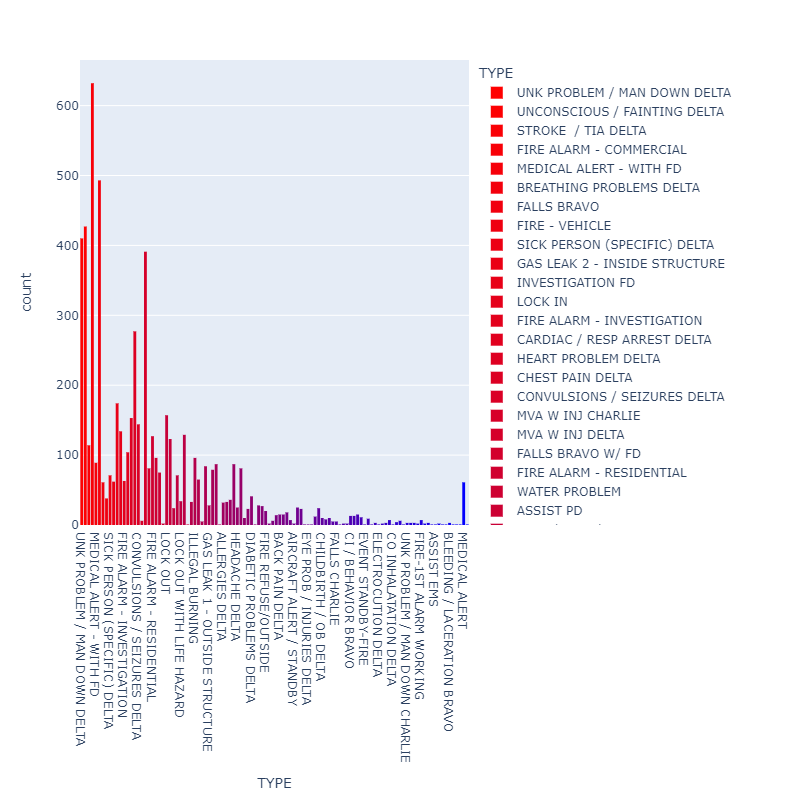

In [31]:
px.histogram(late_night_calls,
       x='TYPE',
      color='TYPE',
      color_discrete_map=graph_colors(late_night_calls.TYPE.unique().tolist(),len(late_night_calls.TYPE.unique())),
      height=800,
      width=1600)

There is definitely some merit to looking at the particular times calls happen!
#### Clean and Expound on the data a little further
I would like to clean the data a little more and be able to plot the call locations to a map. I will need latitude and longitude to be able to do so. 
For this, I can use 'geopy' and 'Nominatim' to get lat/long as an attribute associated to a particular address!

Having looked into and practiced with Nominatim, I know that some address abreviations work, and others don't. 
I know that some addresses are accepted, but some are not. Nominatim has it's limitations, but it works great as an open
source mapping module! So I may not get all the addresses imported from 'First Due' incident reporting and logging software,
but it is still going to show enough data to glean a considerable amount of information, and show trends in call types, locations,
and volume

In [32]:
len(df1['INITIAL ADDRESS'][df1['INITIAL ADDRESS'].str.contains('EXT')].unique())

55

In [33]:
from geopy.geocoders import Nominatim

df1['INITIAL ADDRESS'].replace('TRL','TRAIL',regex=True,inplace=True)
df1['INITIAL ADDRESS'].replace('LAKE AVE EXT','LAKE AVE EXTENSION',regex=True,inplace=True)

#address we need to geocode
address_list = []
address_lat_long = []

for a in range(len(df1)):
    if df1['INITIAL CITY'].iloc[a]!='BREWSTER':
        address_list.append(df1['INITIAL ADDRESS'].iloc[a]+', '+df1['INITIAL CITY'].iloc[a]+', CT')
    else:
        address_list.append(df1['INITIAL ADDRESS'].iloc[a]+', '+df1['INITIAL CITY'].iloc[a]+', NY')

for x in range(len(address_list)):
    address_list[x]= ' '.join(address_list[x].split())

df1[df1['INITIAL ADDRESS'].str.contains('EXTENSION')].head(3)

,DISPATCH UNITS,LOCATION,TYPE,INITIAL ADDRESS,INITIAL CITY,CREATE DATE
63,TAC1,"1 LAKE AVE EXT, DANBURY, CT, 06810",UNK PROBLEM / MAN DOWN DELTA,1 LAKE AVE EXTENSION,DANBURY,2023-12-29 11:12
272,E26,NaN,FIRE ALARM - COMMERCIAL,47 LAKE AVE EXTENSION,DANBURY,2023-12-22 02:02
590,E26,"44 LAKE AVE EXT, DANBURY, CT, 06810",GAS LEAK 1 - OUTSIDE STRUCTURE,44 LAKE AVE EXTENSION,DANBURY,2023-12-11 08:15


The following lines of code will take the the information extracted above, and used to gather the lat/long from Nominatim.
They only need to be run one time (Nominatim can take a long time to compile with the thousands of call locations to be used).
Also, the dataframe will then be written and saved as a CSV file.

In [34]:
"""
geolocator = Nominatim(user_agent="calls",timeout=None)
 
#applying geocode method to get the location
for x in range(len(address_list)):
    if geolocator.geocode(address_list[x])!=None:
        address_lat_long.append([geolocator.geocode(address_list[x]).latitude,
                                 geolocator.geocode(address_list[x]).longitude,
                                 address_list[x]])
        
address_lat_long[:20]
"""

'\ngeolocator = Nominatim(user_agent="calls",timeout=None)\n \n#applying geocode method to get the location\nfor x in range(len(address_list)):\n    if geolocator.geocode(address_list[x])!=None:\n        address_lat_long.append([geolocator.geocode(address_list[x]).latitude,\n                                 geolocator.geocode(address_list[x]).longitude,\n                                 address_list[x]])\n        \naddress_lat_long[:20]\n'

In [35]:
"""
locations = []
loc_no_commas = []
call_type = []
units = []
incident_date = []

for x in range(len(df1)):
    if df1['INITIAL CITY'].iloc[x]!='BREWSTER':
        loc = df1['INITIAL ADDRESS'].iloc[x]+', '+df1['INITIAL CITY'].iloc[x]+', CT'
        locations.append(loc)
        no_comma = df1['INITIAL ADDRESS'].iloc[x]+' '+df1['INITIAL CITY'].iloc[x]+' CT'
        loc_no_commas.append(no_comma)
        units.append(df1['DISPATCH UNITS'].iloc[x])
        call_type.append(df1['TYPE'].iloc[x])
        incident_date.append(df1['CREATE DATE'].iloc[x])
    else:
        loc = df1['INITIAL ADDRESS'].iloc[x]+', '+df1['INITIAL CITY'].iloc[x]+', NY'
        locations.append(loc)
        no_comma = df1['INITIAL ADDRESS'].iloc[x]+' '+df1['INITIAL CITY'].iloc[x]+' NY'
        loc_no_commas.append(no_comma)
        units.append(df1['DISPATCH UNITS'].iloc[x])
        call_type.append(df1['TYPE'].iloc[x])
        incident_date.append(df1['CREATE DATE'].iloc[x])
        
geolocator = Nominatim(user_agent="dfd",timeout=None)

latitude = []
longitude = []
call_loc = []
responders = []
incident_type = []
call_date = []

for x in range(len(locations)):
    if geolocator.geocode(locations[x])!=None:
        latitude.append(geolocator.geocode(locations[x]).latitude)
        longitude.append(geolocator.geocode(locations[x]).longitude)
        call_loc.append(loc_no_commas[x])
        responders.append(units[x])
        incident_type.append(call_type[x])
        call_date.append(incident_date[x])
"""

'\nlocations = []\nloc_no_commas = []\ncall_type = []\nunits = []\nincident_date = []\n\nfor x in range(len(df1)):\n    if df1[\'INITIAL CITY\'].iloc[x]!=\'BREWSTER\':\n        loc = df1[\'INITIAL ADDRESS\'].iloc[x]+\', \'+df1[\'INITIAL CITY\'].iloc[x]+\', CT\'\n        locations.append(loc)\n        no_comma = df1[\'INITIAL ADDRESS\'].iloc[x]+\' \'+df1[\'INITIAL CITY\'].iloc[x]+\' CT\'\n        loc_no_commas.append(no_comma)\n        units.append(df1[\'DISPATCH UNITS\'].iloc[x])\n        call_type.append(df1[\'TYPE\'].iloc[x])\n        incident_date.append(df1[\'CREATE DATE\'].iloc[x])\n    else:\n        loc = df1[\'INITIAL ADDRESS\'].iloc[x]+\', \'+df1[\'INITIAL CITY\'].iloc[x]+\', NY\'\n        locations.append(loc)\n        no_comma = df1[\'INITIAL ADDRESS\'].iloc[x]+\' \'+df1[\'INITIAL CITY\'].iloc[x]+\' NY\'\n        loc_no_commas.append(no_comma)\n        units.append(df1[\'DISPATCH UNITS\'].iloc[x])\n        call_type.append(df1[\'TYPE\'].iloc[x])\n        incident_date.append

In [36]:
"""
df2 = pd.DataFrame({'Latitude':latitude,
                    'Longitude':longitude,
                    'Call_Location':call_loc,
                    'Units':responders,
                    'Call_Type':incident_type,
                    'Call_Date_Time':call_date},
                   columns=['Latitude','Longitude','Call_Location','Units','Call_Type','Call_Date_Time'])
df2.to_csv('2023_incident_dataframe.csv')
"""
df2 = pd.read_csv('2023_incident_dataframe.csv',index_col=0)
df2.head()

,Latitude,Longitude,Call_Location,Units,Call_Type,Call_Date_Time
0,41.400475,-73.457776,375 MAIN ST DANBURY CT,TAC1,UNK PROBLEM / MAN DOWN DELTA,2023-12-31 22:20
1,41.444630,-73.467129,12 MENDES RD DANBURY CT,E25,UNCONSCIOUS / FAINTING DELTA,2023-12-31 21:47
2,41.409278,-73.461390,9 GOLDEN HILL LN DANBURY CT,TAC1,STROKE / TIA DELTA,2023-12-31 21:44
3,41.386668,-73.454612,36 W WOOSTER ST DANBURY CT,E22,FIRE ALARM - COMMERCIAL,2023-12-31 18:15
4,41.380964,-73.437790,25 MEMORIAL DR DANBURY CT,SQ21,MEDICAL ALERT - WITH FD,2023-12-31 18:13


In [37]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5393 entries, 0 to 5392
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Latitude        5393 non-null   float64
 1   Longitude       5393 non-null   float64
 2   Call_Location   5393 non-null   object 
 3   Units           5393 non-null   object 
 4   Call_Type       5393 non-null   object 
 5   Call_Date_Time  5393 non-null   object 
dtypes: float64(2), object(4)
memory usage: 294.9+ KB


#### Lets separate the date and times
Separate the date and the time, and drop the combined date-time column

In [38]:
times = [df2.Call_Date_Time.iloc[x][-5:] for x in range(len(df2))]
dates = [df2.Call_Date_Time.iloc[x][:-6] for x in range(len(df2))]

times = pd.DataFrame({'Date':dates,'Time':times})
df2 = pd.concat([df2,times],axis=1, ignore_index=True,)
cols = ['Latitude','Longitude','Call_Location','Units','Call_Type','Call_Date_Time','Date','Time']

df2.rename(columns={x:y for x,y in zip(df2.columns.tolist(),cols)},inplace=True)
df2.drop(columns='Call_Date_Time',inplace=True)
df2.head()

,Latitude,Longitude,Call_Location,Units,Call_Type,Date,Time
0,41.400475,-73.457776,375 MAIN ST DANBURY CT,TAC1,UNK PROBLEM / MAN DOWN DELTA,2023-12-31,22:20
1,41.444630,-73.467129,12 MENDES RD DANBURY CT,E25,UNCONSCIOUS / FAINTING DELTA,2023-12-31,21:47
2,41.409278,-73.461390,9 GOLDEN HILL LN DANBURY CT,TAC1,STROKE / TIA DELTA,2023-12-31,21:44
3,41.386668,-73.454612,36 W WOOSTER ST DANBURY CT,E22,FIRE ALARM - COMMERCIAL,2023-12-31,18:15
4,41.380964,-73.437790,25 MEMORIAL DR DANBURY CT,SQ21,MEDICAL ALERT - WITH FD,2023-12-31,18:13


In [39]:
mutual_aid = df2[df2.Call_Type.str.contains('MUTUAL AID')]
mutual_aid.head()

,Latitude,Longitude,Call_Location,Units,Call_Type,Date,Time
526,41.371148,-73.415843,208 GREENWOOD AVE BETHEL CT,SQ6,FIRE - MUTUAL AID OUT OF CITY,2023-12-10,10:41
1253,41.460921,-73.507166,54 GILLOTTI RD NEW FAIRFIELD CT,C30,FIRE - MUTUAL AID OUT OF CITY,2023-11-06,05:54
1378,41.452416,-73.387287,9 EVAS DR BROOKFIELD CT,C30,FIRE - MUTUAL AID OUT OF CITY,2023-10-30,13:45
2560,41.445796,-73.404747,246 FEDERAL RD BROOKFIELD CT,"C30, E24, T1",FIRE - MUTUAL AID OUT OF CITY,2023-09-06,19:29
2842,41.256464,-73.439812,49 OWN HOME AVE WILTON CT,C61,FIRE - MUTUAL AID OUT OF CITY,2023-08-23,19:10


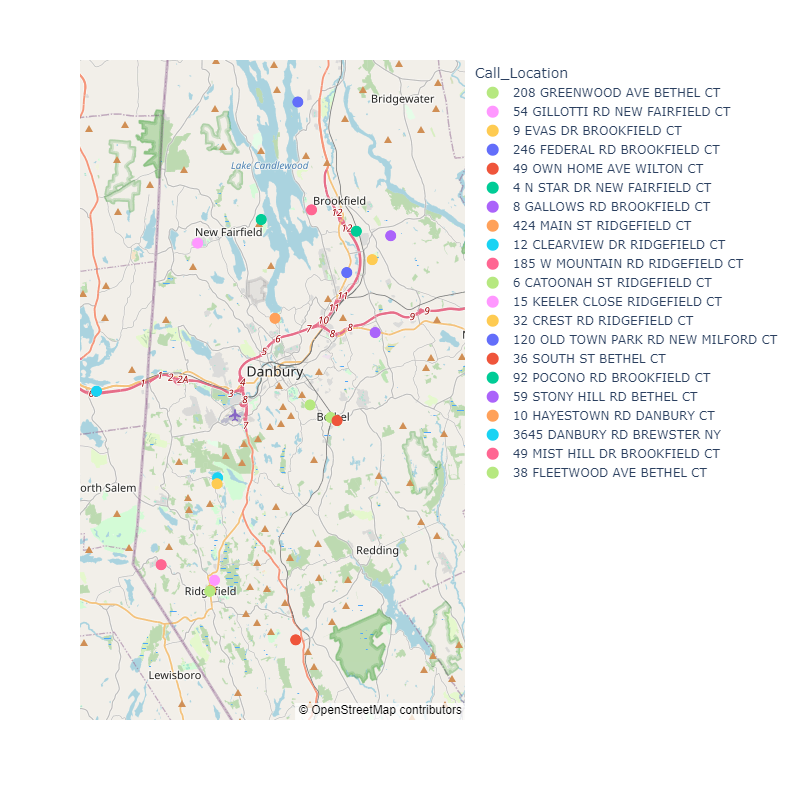

In [40]:
colors = px.colors.n_colors('rgb(0,0,255)', 'rgb(255,0,0)', len(mutual_aid),colortype='rgb')

map_colors = {x:y for x,y in zip(mutual_aid,colors)}
fig = px.scatter_mapbox(mutual_aid,
                        lat='Latitude',
                        lon='Longitude',
                        color='Call_Location',
                        color_discrete_map=map_colors,
                        mapbox_style='open-street-map',
                        zoom=10,
                        height=800,
                        width=1200,
                       )
fig.update_traces(marker=dict(size=12))

Using Plotly is a nice view, but there are other mapping libraries to use.
I would like to see how it looks using Folium and it's modules

In [41]:
import folium
from folium.plugins import MarkerCluster, HeatMap

In [42]:
danbury = (41.394966,-73.454079)
call_map = folium.Map(location=danbury, height=800,width=1200,zoom_start=12)
Locations = MarkerCluster().add_to(call_map)
for lg,ln,add in zip(df2.Latitude.iloc[:100],df2.Longitude.iloc[:100],df2.Call_Location.iloc[:100]):
    folium.Marker(location=[lg,ln], popup=add,icon=None).add_to(Locations)
call_map

That's a bit too much data. So how about narrowing the data down to either companies or call types

In [43]:
calls = folium.Map(location=danbury,zoom_start=12,height=800,width=1200)
data = [[lt,ln] for lt,ln in zip(df2.Latitude,df2.Longitude)]
HeatMap(data,radius=12).add_to(calls)
calls

Folium looks ok, but I like the Plotly Express maps better

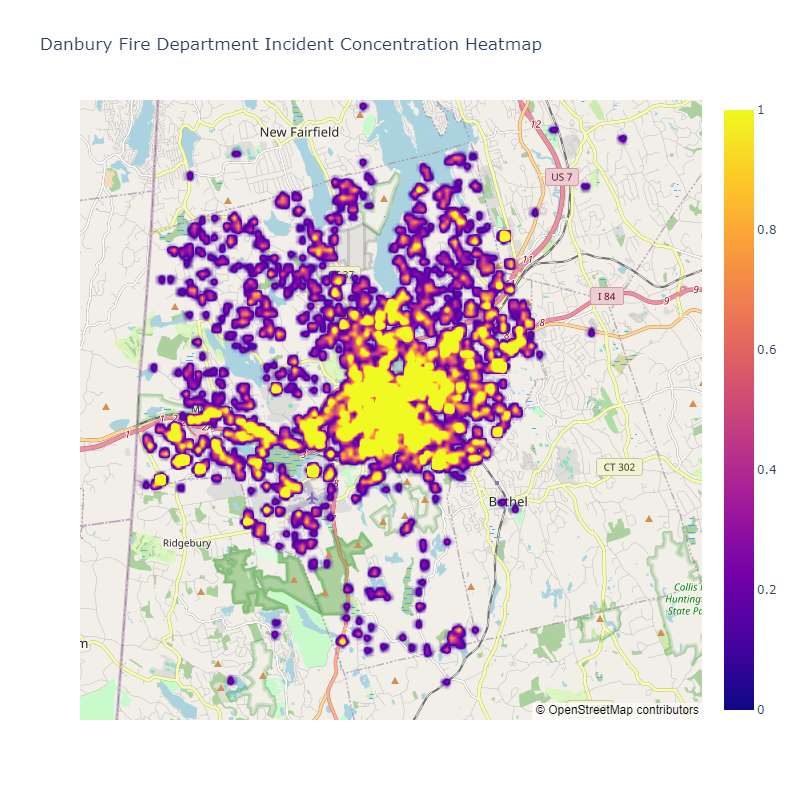

In [44]:
fig = px.density_mapbox(df2,
                        lat='Latitude',
                        lon='Longitude',
                        center={'lat':41.394966,'lon':-73.454079},
                        zoom=11,
                        mapbox_style='open-street-map',
                        radius=6,
                        title= 'Danbury Fire Department Incident Concentration Heatmap',
                        height=800,
                        width=1200,
                       )
fig.show()

In [45]:
df2

,Latitude,Longitude,Call_Location,Units,Call_Type,Date,Time
0,41.400475,-73.457776,375 MAIN ST DANBURY CT,TAC1,UNK PROBLEM / MAN DOWN DELTA,2023-12-31,22:20
1,41.444630,-73.467129,12 MENDES RD DANBURY CT,E25,UNCONSCIOUS / FAINTING DELTA,2023-12-31,21:47
2,41.409278,-73.461390,9 GOLDEN HILL LN DANBURY CT,TAC1,STROKE / TIA DELTA,2023-12-31,21:44
3,41.386668,-73.454612,36 W WOOSTER ST DANBURY CT,E22,FIRE ALARM - COMMERCIAL,2023-12-31,18:15
4,41.380964,-73.437790,25 MEMORIAL DR DANBURY CT,SQ21,MEDICAL ALERT - WITH FD,2023-12-31,18:13
...,...,...,...,...,...,...,...
5388,41.389706,-73.443571,33 TOWN HILL AVE DANBURY CT,TAC1,CHEST PAIN DELTA,2023-04-25,13:59
5389,41.382131,-73.525821,33 ABBEY LN DANBURY CT,E26,SICK PERSON (SPECIFIC) BRAVO,2023-04-25,13:52
5390,41.380964,-73.437790,25 MEMORIAL DR DANBURY CT,TAC1,MEDICAL ALERT,2023-04-25,13:39
5391,41.432998,-73.434101,28 CORN TASSLE RD DANBURY CT,E24,FIRE ALARM - RESIDENTIAL,2023-04-25,13:14


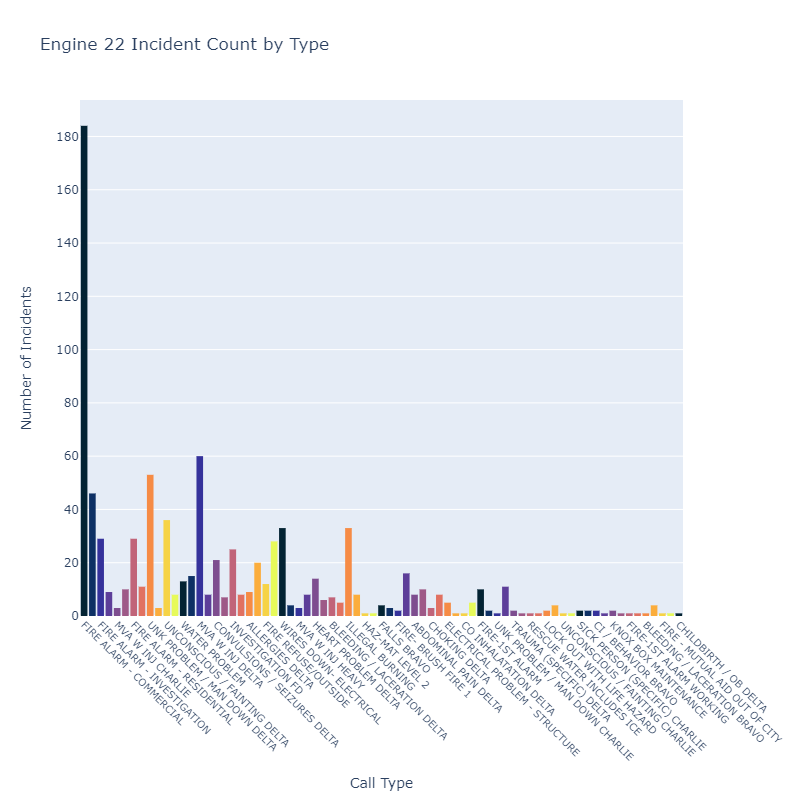

In [46]:
eng22_calls = df2[df2.Units.str.contains('E22')]
eng22_bar = px.histogram(eng22_calls,
                         x='Call_Type',
                         color='Call_Type',
                         color_discrete_sequence=px.colors.sequential.thermal,
                         title="Engine 22 Incident Count by Type",
                         height=800,
                         width=1600)
eng22_bar.update_layout(yaxis_title='Number of Incidents',
                        xaxis_title='Call Type',
                        showlegend=False)
eng22_bar.update_xaxes(tickangle=45,
                       tickfont=dict(size=10))

Let's create a function that will collet the call type data for different companies

In [47]:
def calls_by_company(company):
    company = company.upper()
    calls = df2[df2.Units.str.contains(company)]
    bar = px.histogram(calls,
                       x='Call_Type',
                       color='Call_Type',
                       color_discrete_sequence=px.colors.sequential.thermal,
                       title=f"{company} Incident Count by Type",
                       height=800,
                       width=1400)
    bar.update_layout(yaxis_title='Number of Incidents',
                      xaxis_title='Call Type',
                      showlegend=False)
    bar.update_xaxes(tickangle=45,
                     tickfont=dict(size=10))
    return bar

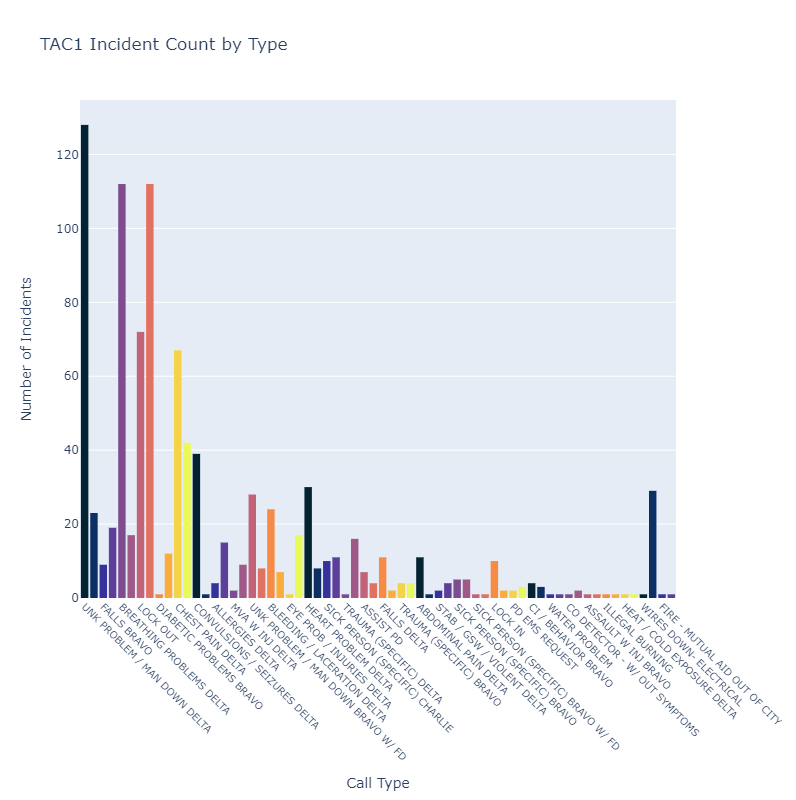

In [48]:
calls_by_company('tac1')

#### Create Some Functions to Help Parse Data and Expand on Data

In [49]:
mapper=graph_colors(df2.Call_Type.unique(),len(df2.Call_Type.unique()))

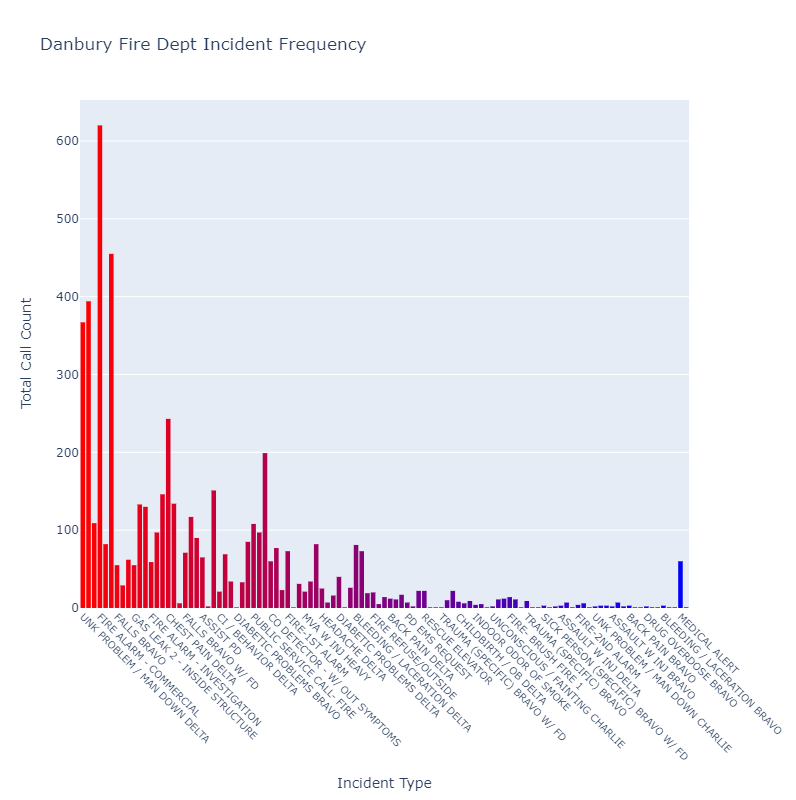

In [50]:
fig = px.histogram(df2,x='Call_Type',
             color='Call_Type',
             color_discrete_map=mapper,
             title='Danbury Fire Dept Incident Frequency',
             height=800,
             width=1600,
            )
fig.update_layout(yaxis_title='Total Call Count',
                 xaxis_title='Incident Type',
                 showlegend=False)
fig.update_xaxes(tickangle=45,
                 tickfont=dict(size=10))

In [51]:
def company_heatmap(company):
    company = company.upper()
    df = df2[df2.Units.str.contains(company)]
    district = {'HQ':(41.393510,-73.455480),
                'E23':(41.407951,-73.436729),
                'E24':(41.413050,-73.422240),
                'E25':(41.427157,-73.504407),
                'E26':(41.373615,-73.487025)}
    if company not in ['E23','E24','E25','E26']:
        lat = district['HQ'][0]
        long = district['HQ'][1]
    else:
        lat=district[company][0]
        long=district[company][1]
        
    fig = px.density_mapbox(df,
                            lat='Latitude',
                            lon='Longitude',
                            hover_data=['Call_Type','Call_Location'],
                            center={'lat':lat,'lon':long},
                            zoom=11,
                            mapbox_style='open-street-map',
                            radius=6,
                            title= f'Danbury Fire Department Incident Concentration Heatmap for {company.upper()}',
                            height=800,
                            width=1200,
                           )

    return fig

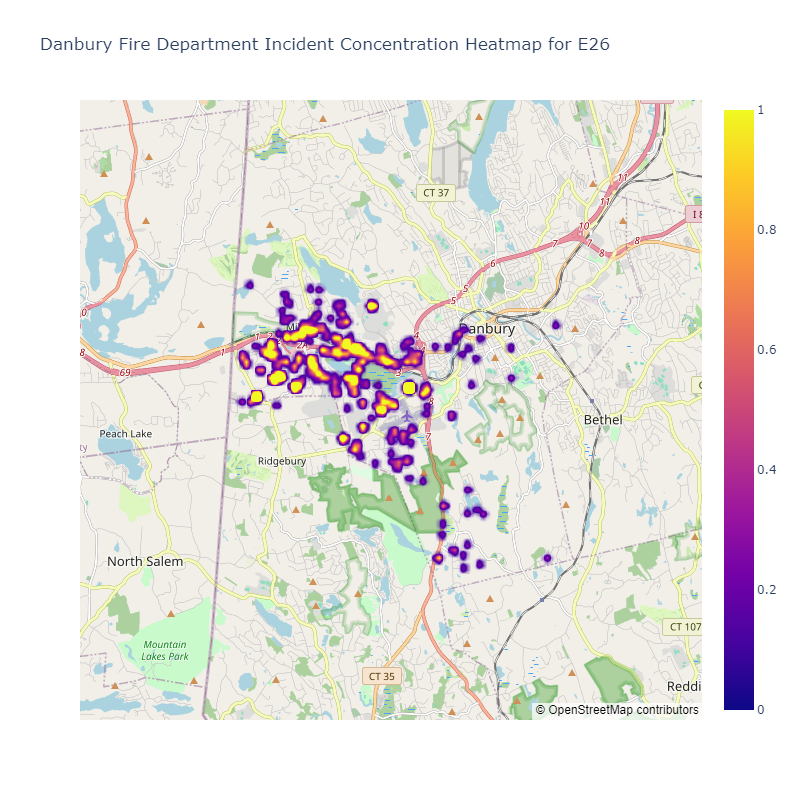

In [52]:
company_heatmap('E26')

##### Time Comparisons
Work on time comparisons between times of day, company responses during certain hours, etc

In [53]:
df2[df2.Time<'07:00'] 

,Latitude,Longitude,Call_Location,Units,Call_Type,Date,Time
21,41.392507,-73.453091,30 WEST ST DANBURY CT,TAC1,BREATHING PROBLEMS DELTA,2023-12-31,06:14
22,41.388912,-73.435781,51 SOUTH ST DANBURY CT,"E22, T1",FIRE ALARM - COMMERCIAL,2023-12-31,03:17
23,41.396829,-73.457640,1 KENNEDY AVE DANBURY CT,E22,FIRE ALARM - INVESTIGATION,2023-12-31,01:05
39,41.360682,-73.443128,154 BRUSHY HILL RD DANBURY CT,E22,MVA W INJ CHARLIE,2023-12-30,04:25
40,41.392134,-73.449927,132 MAIN ST DANBURY CT,TAC1,BREATHING PROBLEMS DELTA,2023-12-30,02:10
...,...,...,...,...,...,...,...
5370,41.439642,-73.415147,5 NABBY RD DANBURY CT,E24,CARDIAC / RESP ARREST DELTA,2023-04-26,06:34
5371,41.384411,-73.526194,17 WEST CROSS TRAIL DANBURY CT,E26,CHEST PAIN DELTA,2023-04-26,03:22
5372,41.399501,-73.445123,183 WHITE ST DANBURY CT,E23,FIRE ALARM - COMMERCIAL,2023-04-26,03:09
5373,41.387021,-73.442278,124 SOUTH ST DANBURY CT,SQ21,BREATHING PROBLEMS DELTA,2023-04-26,00:33


In [54]:
df2[(df2.Units.str.contains('TAC1')) & (df2.Time<'07:00') | (df2.Time>='21:00')]

,Latitude,Longitude,Call_Location,Units,Call_Type,Date,Time
0,41.400475,-73.457776,375 MAIN ST DANBURY CT,TAC1,UNK PROBLEM / MAN DOWN DELTA,2023-12-31,22:20
1,41.444630,-73.467129,12 MENDES RD DANBURY CT,E25,UNCONSCIOUS / FAINTING DELTA,2023-12-31,21:47
2,41.409278,-73.461390,9 GOLDEN HILL LN DANBURY CT,TAC1,STROKE / TIA DELTA,2023-12-31,21:44
21,41.392507,-73.453091,30 WEST ST DANBURY CT,TAC1,BREATHING PROBLEMS DELTA,2023-12-31,06:14
24,41.396829,-73.457640,1 KENNEDY AVE DANBURY CT,E22,FIRE ALARM - COMMERCIAL,2023-12-30,23:59
...,...,...,...,...,...,...,...
5314,41.382255,-73.426778,10 SOUTH ST DANBURY CT,TAC1,UNCONSCIOUS / FAINTING DELTA,2023-04-28,22:15
5353,41.395432,-73.411814,151 SHELTER ROCK RD DANBURY CT,E24,ABDOMINAL PAIN DELTA,2023-04-26,22:23
5375,41.390634,-73.448846,88 MAIN ST DANBURY CT,T1,LOCK IN,2023-04-25,23:30
5376,41.424280,-73.421786,114 FEDERAL RD DANBURY CT,E24,FALLS BRAVO,2023-04-25,22:22


In [55]:
def incident_times(gt_time,lt_time,unit):
    # time1 and time2 are to be entered as a string in the format 'HH:MM' 24 hr time (military time)
    # and times must be in range 00:00 to 23:59. 
    gt_time = str(gt_time)
    lt_time = str(lt_time)
    unit = unit.upper()
    
    time_range = df2[(df2.Units.str.contains(unit)) & (df2.Time>gt_time) & (df2.Time<lt_time)]
    mapper = time_range.Call_Type.unique().tolist()
    fig = px.histogram(time_range,
                       x='Call_Type',
                       color='Call_Type',
                       color_discrete_map=graph_colors(time_range.Call_Type.unique().tolist(),
                                                       len(time_range.Call_Type.unique()),
                                                       color='green'),
                       title=f'Incident Type and Count for {unit} between the hours of {gt_time} and {lt_time}',
                       height=800,
                       width=1600,
                      )
    fig.update_layout(showlegend=False,
                      xaxis_title='Incident Type',
                      yaxis_title='Total Number of Incidents',
                     )
    fig.update_xaxes(tickangle=45,
                     tickfont={'size':10},
                    )
    
    return fig

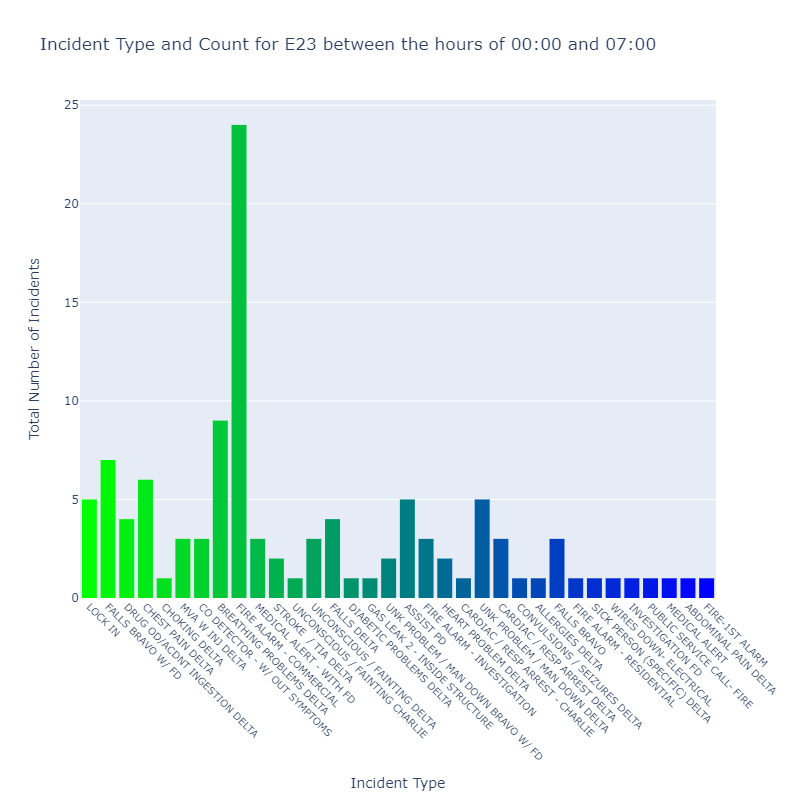

In [56]:
incident_times('00:00','07:00','e23')

In [57]:
call_month = df2[df2.Date.str.contains('\d{4}-06-\d{2}')]

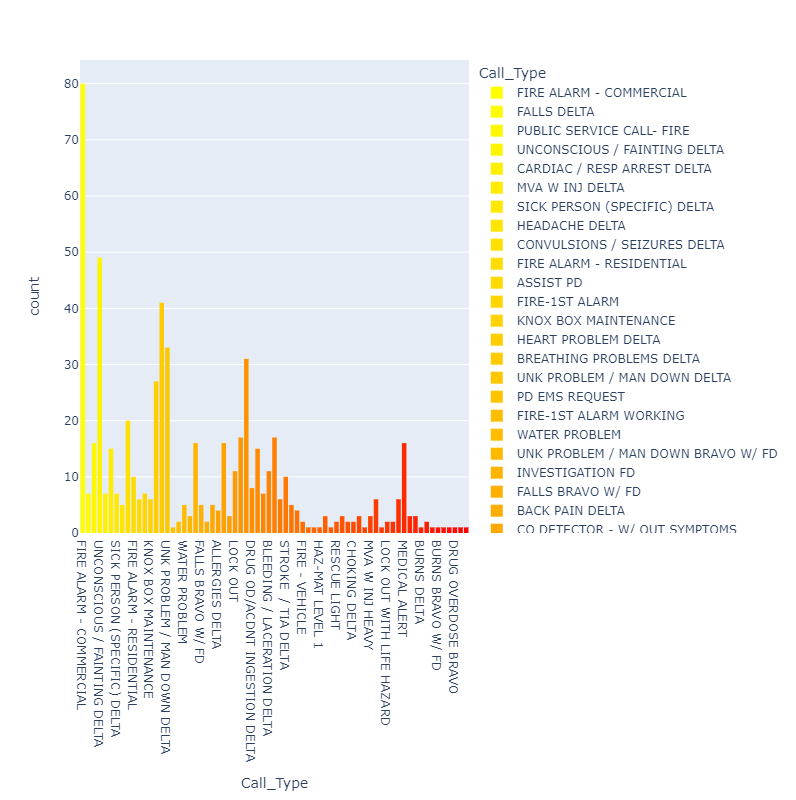

In [58]:
px.histogram(call_month,
             x='Call_Type',
             color='Call_Type',
             color_discrete_map=graph_colors(call_month.Call_Type.unique().tolist(),
                                             len(call_month.Call_Type.unique()),
                                             'yellow'),
             height=800,
             width=1200,
            )


In [59]:
call_month.Call_Type.value_counts()

FIRE ALARM - COMMERCIAL         80
UNCONSCIOUS / FAINTING DELTA    49
BREATHING PROBLEMS DELTA        41
UNK PROBLEM / MAN DOWN DELTA    33
CHEST PAIN DELTA                31
                                ..
TRAUMA (SPECIFIC) DELTA          1
ABDOMINAL PAIN BRAVO             1
DRUG OVERDOSE BRAVO              1
UNK PROBLEM / MAN DOWN BRAVO     1
FIRE- BRUSH FIRE 1               1
Name: Call_Type, Length: 69, dtype: int64

In [60]:
# incident type comparison by type monthly
months = list(range(1,13))
for m in months:
    m = '0'+str(m)
print(months)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


In [61]:
def monthly_incidents(month,df=df2):
    if month < 10:
        monthly_df = df[df.Date.str.contains('2023-0'+str(month))]
    else:
        monthly_df = df[df.Date.str.contains('2023-'+str(month))]
    
    month_dict = {1:'January',
                  2:'February',
                  3:'March',
                  4:'April',
                  5:'May',
                  6:'June',
                  7:'July',
                  8:'August',
                  9:'September',
                  10:'October',
                  11:'November',
                  12:'December'
                 }
    
    fig = px.density_mapbox(monthly_df,
                            lat='Latitude',
                            lon='Longitude',
                            hover_data=['Call_Type','Call_Location','Units'],
                            center={'lat':41.393510,'lon':-73.455480},
                            color_continuous_scale=px.colors.sequential.solar,
                            zoom=11,
                            mapbox_style='open-street-map',
                            radius=7,
                            title=f'Incident Volume by Address for the month of {month_dict[month]}',
                            height=800,
                            width=1600,
                           )     
    return fig 

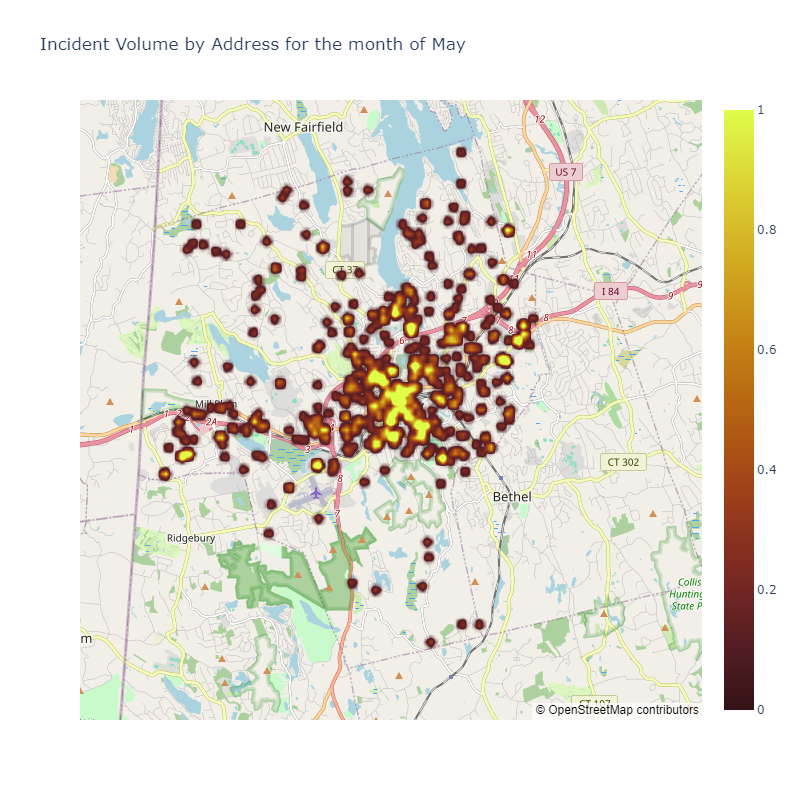

In [62]:
monthly_incidents(5)

In [63]:
all_units = ['TAC1','SQ21','E22','E23','E24','E25','E26','T1','C30']

def comp_calltype (unit,call,df=df2):
    comp_calltype_df = df[(df.Units.str.contains(unit)) & (df.Call_Type==call)]
    return comp_calltype_df
    
comp_calltype('E22','')

,Latitude,Longitude,Call_Location,Units,Call_Type,Date,Time


In [64]:
incident_type_list = df2.Call_Type.unique().tolist()

In [65]:
run_num_df = pd.DataFrame(np.zeros((len(incident_type_list),len(all_units))),index=incident_type_list,columns=all_units)
run_num_df.head()

,TAC1,SQ21,E22,E23,E24,E25,E26,T1,C30
UNK PROBLEM / MAN DOWN DELTA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
UNCONSCIOUS / FAINTING DELTA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
STROKE / TIA DELTA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
FIRE ALARM - COMMERCIAL,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MEDICAL ALERT - WITH FD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [121]:
for company in all_units:
    for call in incident_type_list:
        count = comp_calltype(company,call).Call_Type.count()
        run_num_df.loc[call][company]=count

run_num_df.insert(0,"Call_Type",incident_type_list)

run_num_df

,Call_Type,TAC1,SQ21,E22,E23,E24,E25,E26,T1,C30
UNK PROBLEM / MAN DOWN DELTA,UNK PROBLEM / MAN DOWN DELTA,128.0,45.0,53.0,46.0,40.0,13.0,31.0,5.0,5.0
UNCONSCIOUS / FAINTING DELTA,UNCONSCIOUS / FAINTING DELTA,112.0,36.0,36.0,64.0,47.0,34.0,58.0,1.0,1.0
STROKE / TIA DELTA,STROKE / TIA DELTA,23.0,11.0,15.0,25.0,11.0,16.0,9.0,0.0,0.0
FIRE ALARM - COMMERCIAL,FIRE ALARM - COMMERCIAL,3.0,17.0,184.0,143.0,61.0,17.0,90.0,193.0,183.0
MEDICAL ALERT - WITH FD,MEDICAL ALERT - WITH FD,17.0,28.0,9.0,13.0,2.0,4.0,8.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
BLEEDING / LACERATION BRAVO,BLEEDING / LACERATION BRAVO,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
ASSAULT W INJ CHARLIE,ASSAULT W INJ CHARLIE,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
BACK PAIN CHARLIE,BACK PAIN CHARLIE,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MEDICAL ALERT,MEDICAL ALERT,29.0,9.0,4.0,6.0,4.0,4.0,4.0,1.0,1.0


In [67]:
import dash
from dash import dash_table

In [68]:
dash_table.DataTable(run_num_df.to_dict('records'),columns=[{'name':i,'id':i} for i in run_num_df.columns])

DataTable(data=[{'Call_Type': 'UNK PROBLEM / MAN DOWN DELTA', 'TAC1': 128.0, 'SQ21': 45.0, 'E22': 53.0, 'E23': 46.0, 'E24': 40.0, 'E25': 13.0, 'E26': 31.0, 'T1': 5.0, 'C30': 5.0}, {'Call_Type': 'UNCONSCIOUS / FAINTING DELTA', 'TAC1': 112.0, 'SQ21': 36.0, 'E22': 36.0, 'E23': 64.0, 'E24': 47.0, 'E25': 34.0, 'E26': 58.0, 'T1': 1.0, 'C30': 1.0}, {'Call_Type': 'STROKE  / TIA DELTA', 'TAC1': 23.0, 'SQ21': 11.0, 'E22': 15.0, 'E23': 25.0, 'E24': 11.0, 'E25': 16.0, 'E26': 9.0, 'T1': 0.0, 'C30': 0.0}, {'Call_Type': 'FIRE ALARM - COMMERCIAL', 'TAC1': 3.0, 'SQ21': 17.0, 'E22': 184.0, 'E23': 143.0, 'E24': 61.0, 'E25': 17.0, 'E26': 90.0, 'T1': 193.0, 'C30': 183.0}, {'Call_Type': 'MEDICAL ALERT - WITH FD', 'TAC1': 17.0, 'SQ21': 28.0, 'E22': 9.0, 'E23': 13.0, 'E24': 2.0, 'E25': 4.0, 'E26': 8.0, 'T1': 0.0, 'C30': 0.0}, {'Call_Type': 'BREATHING PROBLEMS DELTA', 'TAC1': 112.0, 'SQ21': 65.0, 'E22': 46.0, 'E23': 97.0, 'E24': 48.0, 'E25': 30.0, 'E26': 51.0, 'T1': 0.0, 'C30': 0.0}, {'Call_Type': 'FALLS BRAVO

In [69]:
companies = ['TAC1','SQ21','E22','E23','E24','E25','E26','T1','C30','ALL']


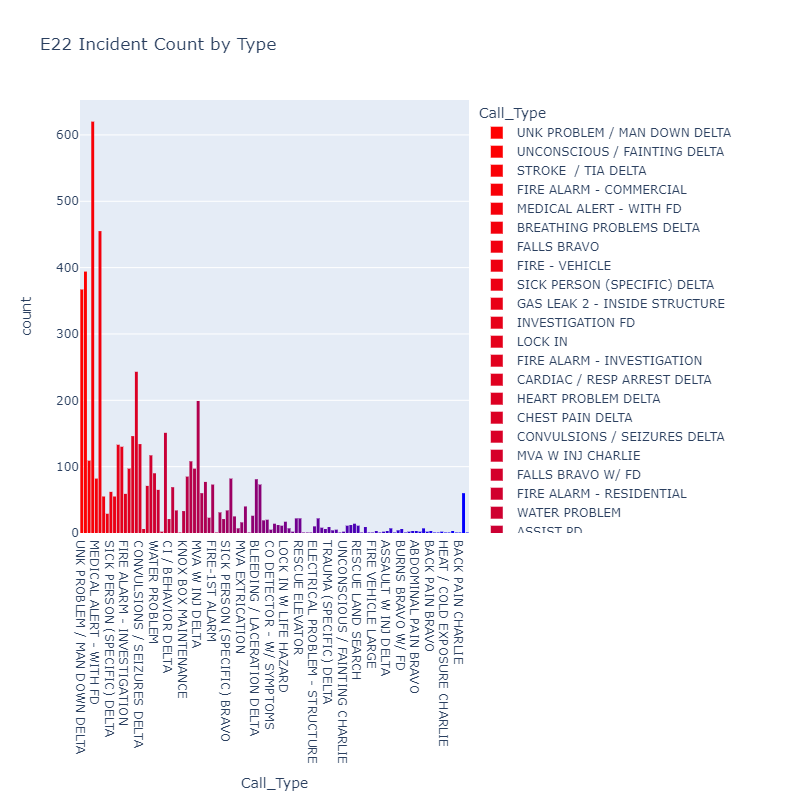

In [70]:
px.histogram(data_frame=df2,
             x=df2.Call_Type,
             color=df2.Call_Type,
             color_discrete_map=graph_colors(df2.Call_Type.unique().tolist(),
                                                  len(df2.Call_Type.unique().tolist()),
                                                  color='red'),
             title=f"{'E22'} Incident Count by Type",
             height=800,
             width=1400)

In [71]:
times = [f'0{x}:00' if x < 10 else f'{x}:00' for x in range(24)]
times.append('23:59')
times

['00:00',
 '01:00',
 '02:00',
 '03:00',
 '04:00',
 '05:00',
 '06:00',
 '07:00',
 '08:00',
 '09:00',
 '10:00',
 '11:00',
 '12:00',
 '13:00',
 '14:00',
 '15:00',
 '16:00',
 '17:00',
 '18:00',
 '19:00',
 '20:00',
 '21:00',
 '22:00',
 '23:00',
 '23:59']

In [72]:
month_dict = {'January':'01',
                  'February':'02',
                  'March':'03',
                  'April':'04',
                  'May':'05',
                  'June':'06',
                  'July':'07',
                  'August':'08',
                  'September':'09',
                  'October':'10',
                  'November':'11',
                  'December':'12'}

In [73]:
month='April'

In [74]:
'2023-'+month_dict[month.capitalize()]

'2023-04'

In [75]:
df2

,Latitude,Longitude,Call_Location,Units,Call_Type,Date,Time
0,41.400475,-73.457776,375 MAIN ST DANBURY CT,TAC1,UNK PROBLEM / MAN DOWN DELTA,2023-12-31,22:20
1,41.444630,-73.467129,12 MENDES RD DANBURY CT,E25,UNCONSCIOUS / FAINTING DELTA,2023-12-31,21:47
2,41.409278,-73.461390,9 GOLDEN HILL LN DANBURY CT,TAC1,STROKE / TIA DELTA,2023-12-31,21:44
3,41.386668,-73.454612,36 W WOOSTER ST DANBURY CT,E22,FIRE ALARM - COMMERCIAL,2023-12-31,18:15
4,41.380964,-73.437790,25 MEMORIAL DR DANBURY CT,SQ21,MEDICAL ALERT - WITH FD,2023-12-31,18:13
...,...,...,...,...,...,...,...
5388,41.389706,-73.443571,33 TOWN HILL AVE DANBURY CT,TAC1,CHEST PAIN DELTA,2023-04-25,13:59
5389,41.382131,-73.525821,33 ABBEY LN DANBURY CT,E26,SICK PERSON (SPECIFIC) BRAVO,2023-04-25,13:52
5390,41.380964,-73.437790,25 MEMORIAL DR DANBURY CT,TAC1,MEDICAL ALERT,2023-04-25,13:39
5391,41.432998,-73.434101,28 CORN TASSLE RD DANBURY CT,E24,FIRE ALARM - RESIDENTIAL,2023-04-25,13:14


In [76]:
month = 'September'
month_dict = {'January':'01',
                  'February':'02',
                  'March':'03',
                  'April':'04',
                  'May':'05',
                  'June':'06',
                  'July':'07',
                  'August':'08',
                  'September':'09',
                  'October':'10',
                  'November':'11',
                  'December':'12'}
    
monthly_df = df2[df2.Date.str.contains('2023-'+month_dict[month])]
monthly_df

,Latitude,Longitude,Call_Location,Units,Call_Type,Date,Time
2019,41.388890,-73.469468,67 LAKE AVE DANBURY CT,"C30, E22",FIRE ALARM - COMMERCIAL,2023-09-30,23:24
2020,41.377834,-73.459418,197 SOUTHERN BLVD DANBURY CT,E22,MVA W INJ DELTA,2023-09-30,22:19
2021,41.380964,-73.437790,25 MEMORIAL DR DANBURY CT,T1,LOCK IN,2023-09-30,18:42
2022,41.390569,-73.429468,42 SHELTER ROCK RD DANBURY CT,E22,FIRE ALARM - COMMERCIAL,2023-09-30,17:43
2023,41.410144,-73.412884,81 NEWTOWN RD DANBURY CT,E23,FALLS DELTA,2023-09-30,16:59
...,...,...,...,...,...,...,...
2686,41.382237,-73.443018,21 MEMORIAL DR DANBURY CT,"C30, E22, SQ21",RESCUE LIGHT,2023-09-01,10:10
2687,41.413281,-73.431663,73 SAND PIT RD DANBURY CT,E23,CHEST PAIN DELTA,2023-09-01,09:51
2688,41.438668,-73.425014,226 DOGWOOD LN DANBURY CT,E24,BREATHING PROBLEMS DELTA,2023-09-01,08:22
2689,41.391402,-73.480231,14 SCUPPO RD DANBURY CT,E26,CONVULSIONS / SEIZURES DELTA,2023-09-01,06:57


In [77]:
type(df2.Date.iloc[0])

str

In [78]:
run_num_df

,Call_Type,TAC1,SQ21,E22,E23,E24,E25,E26,T1,C30
UNK PROBLEM / MAN DOWN DELTA,UNK PROBLEM / MAN DOWN DELTA,128.0,45.0,53.0,46.0,40.0,13.0,31.0,5.0,5.0
UNCONSCIOUS / FAINTING DELTA,UNCONSCIOUS / FAINTING DELTA,112.0,36.0,36.0,64.0,47.0,34.0,58.0,1.0,1.0
STROKE / TIA DELTA,STROKE / TIA DELTA,23.0,11.0,15.0,25.0,11.0,16.0,9.0,0.0,0.0
FIRE ALARM - COMMERCIAL,FIRE ALARM - COMMERCIAL,3.0,17.0,184.0,143.0,61.0,17.0,90.0,193.0,183.0
MEDICAL ALERT - WITH FD,MEDICAL ALERT - WITH FD,17.0,28.0,9.0,13.0,2.0,4.0,8.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
BLEEDING / LACERATION BRAVO,BLEEDING / LACERATION BRAVO,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
ASSAULT W INJ CHARLIE,ASSAULT W INJ CHARLIE,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
BACK PAIN CHARLIE,BACK PAIN CHARLIE,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MEDICAL ALERT,MEDICAL ALERT,29.0,9.0,4.0,6.0,4.0,4.0,4.0,1.0,1.0


In [79]:
df2[(df2.Time>'00:00') & (df2.Time<'08:00')]

,Latitude,Longitude,Call_Location,Units,Call_Type,Date,Time
21,41.392507,-73.453091,30 WEST ST DANBURY CT,TAC1,BREATHING PROBLEMS DELTA,2023-12-31,06:14
22,41.388912,-73.435781,51 SOUTH ST DANBURY CT,"E22, T1",FIRE ALARM - COMMERCIAL,2023-12-31,03:17
23,41.396829,-73.457640,1 KENNEDY AVE DANBURY CT,E22,FIRE ALARM - INVESTIGATION,2023-12-31,01:05
39,41.360682,-73.443128,154 BRUSHY HILL RD DANBURY CT,E22,MVA W INJ CHARLIE,2023-12-30,04:25
40,41.392134,-73.449927,132 MAIN ST DANBURY CT,TAC1,BREATHING PROBLEMS DELTA,2023-12-30,02:10
...,...,...,...,...,...,...,...
5370,41.439642,-73.415147,5 NABBY RD DANBURY CT,E24,CARDIAC / RESP ARREST DELTA,2023-04-26,06:34
5371,41.384411,-73.526194,17 WEST CROSS TRAIL DANBURY CT,E26,CHEST PAIN DELTA,2023-04-26,03:22
5372,41.399501,-73.445123,183 WHITE ST DANBURY CT,E23,FIRE ALARM - COMMERCIAL,2023-04-26,03:09
5373,41.387021,-73.442278,124 SOUTH ST DANBURY CT,SQ21,BREATHING PROBLEMS DELTA,2023-04-26,00:33


In [80]:
def day_night_calls(unit):
    night = df2[(df2.Units.str.contains(unit)) & (df2.Time>'19:00') | (df2.Time<'07:00')]
    day = df2[(df2.Units.str.contains(unit)) & (df2.Time>='07:00') & (df2.Time<'19:00')]
    night_total = night.Call_Type.value_counts().sum()
    day_total = day.Call_Type.value_counts().sum()
    return night_total,day_total

In [81]:
day_night_calls('E23')[1]

628

In [82]:
[day_night_calls(unit)[1] for unit in all_units]

[648, 346, 569, 628, 382, 250, 422, 252, 215]

In [83]:
day_night_df = pd.DataFrame({'Unit': all_units,
                             'Day': [day_night_calls(unit)[1] for unit in all_units],
                             'Night':[day_night_calls(unit)[0] for unit in all_units]},
                            columns=['Unit','Day','Night'])
day_night_df

,Unit,Day,Night
0,TAC1,648,866
1,SQ21,346,803
2,E22,569,877
3,E23,628,865
4,E24,382,796
5,E25,250,758
6,E26,422,798
7,T1,252,789
8,C30,215,752


In [84]:
len(times)

25

In [85]:
df2[(df2.Time>'00:00') & (df2.Time<'01:00')].Call_Type.count()

124

In [86]:
companies = ['ALL']
[companies.append(u) for u in all_units]
companies    

['ALL', 'TAC1', 'SQ21', 'E22', 'E23', 'E24', 'E25', 'E26', 'T1', 'C30']

In [87]:
call_volume_by_time_df = pd.DataFrame({'Times':[times[t]+'-'+times[t+1] for t in range(24)]})

for company in companies:
    count =[]
    for t in range(24):
        if company == 'ALL':
            total_count = df2[(df2.Time>times[t]) & (df2.Time<times[t+1])].Call_Type.count()
            count.append(total_count)
        else:
            comp_count = df2[(df2.Units==company) & (df2.Time>times[t]) & (df2.Time<times[t+1])].Call_Type.count()
            count.append(comp_count)
            
    call_volume_by_time_df = pd.concat([call_volume_by_time_df,pd.DataFrame({company:count})],axis=1,ignore_index=True)
call_volume_by_time_df

,0,1,2,3,4,5,6,7,8,9,10
0,00:00-01:00,124,30,16,16,14,12,0,11,4,4
1,01:00-02:00,110,25,14,17,16,12,5,10,3,0
2,02:00-03:00,94,15,10,11,18,2,5,13,3,0
3,03:00-04:00,90,14,3,15,17,8,3,15,3,1
4,04:00-05:00,64,18,4,11,10,7,2,3,4,0
5,05:00-06:00,84,16,9,14,11,12,1,8,5,2
6,06:00-07:00,102,15,6,16,14,9,4,12,1,6
7,07:00-08:00,181,33,18,26,30,17,13,16,2,4
8,08:00-09:00,225,39,20,27,37,29,11,22,4,6
9,09:00-10:00,274,52,21,35,44,21,21,23,6,6


In [88]:
columns = ['Time_Period']
[columns.append(c) for c in companies]
column_map = {x:y for x,y in zip(call_volume_by_time_df.columns,columns)}
call_volume_by_time_df.rename(columns=column_map, inplace=True)

In [89]:
call_volume_by_time_df

,Time_Period,ALL,TAC1,SQ21,E22,E23,E24,E25,E26,T1,C30
0,00:00-01:00,124,30,16,16,14,12,0,11,4,4
1,01:00-02:00,110,25,14,17,16,12,5,10,3,0
2,02:00-03:00,94,15,10,11,18,2,5,13,3,0
3,03:00-04:00,90,14,3,15,17,8,3,15,3,1
4,04:00-05:00,64,18,4,11,10,7,2,3,4,0
5,05:00-06:00,84,16,9,14,11,12,1,8,5,2
6,06:00-07:00,102,15,6,16,14,9,4,12,1,6
7,07:00-08:00,181,33,18,26,30,17,13,16,2,4
8,08:00-09:00,225,39,20,27,37,29,11,22,4,6
9,09:00-10:00,274,52,21,35,44,21,21,23,6,6


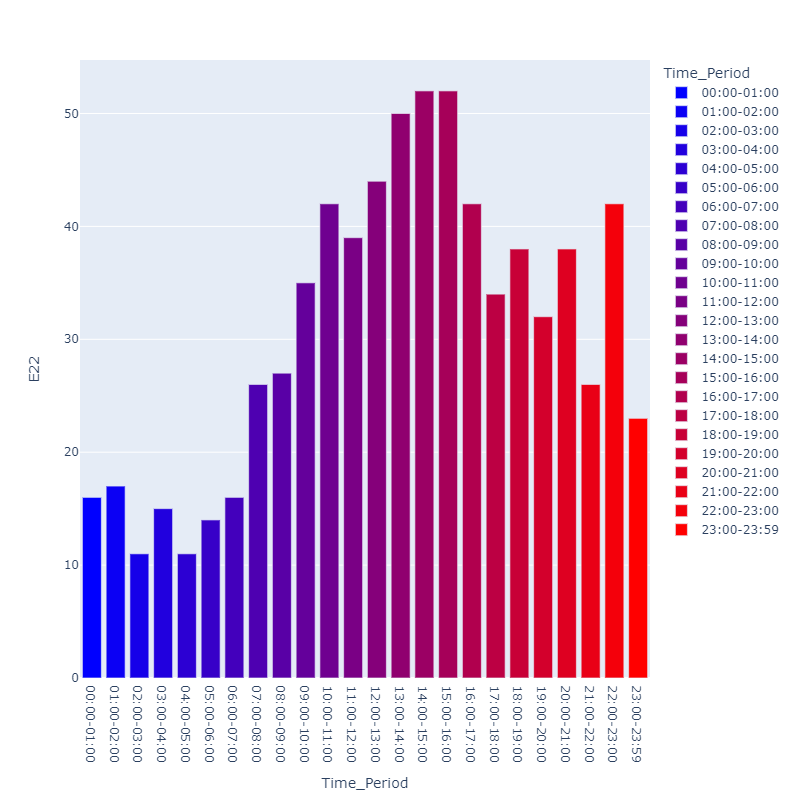

In [90]:
px.bar(call_volume_by_time_df,
       x='Time_Period',
       y='E22',
       color='Time_Period',
       color_discrete_map=graph_colors(call_volume_by_time_df.Time_Period,
                                       len(call_volume_by_time_df),
                                       color='blue'),
       width=800,
       height=800)

In [130]:
run_num_df = pd.DataFrame(np.zeros((len(incident_type_list),len(all_units))),index=incident_type_list,columns=all_units)
run_num_df = run_num_df.copy()

In [131]:
for company in all_units:
    count_list = []
    for call in incident_type_list:
        count = comp_calltype(company,call).Call_Type.count()
        run_num_df.loc[call,company]=count

In [132]:
run_num_df

,TAC1,SQ21,E22,E23,E24,E25,E26,T1,C30
UNK PROBLEM / MAN DOWN DELTA,128.0,45.0,53.0,46.0,40.0,13.0,31.0,5.0,5.0
UNCONSCIOUS / FAINTING DELTA,112.0,36.0,36.0,64.0,47.0,34.0,58.0,1.0,1.0
STROKE / TIA DELTA,23.0,11.0,15.0,25.0,11.0,16.0,9.0,0.0,0.0
FIRE ALARM - COMMERCIAL,3.0,17.0,184.0,143.0,61.0,17.0,90.0,193.0,183.0
MEDICAL ALERT - WITH FD,17.0,28.0,9.0,13.0,2.0,4.0,8.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
BLEEDING / LACERATION BRAVO,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
ASSAULT W INJ CHARLIE,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
BACK PAIN CHARLIE,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MEDICAL ALERT,29.0,9.0,4.0,6.0,4.0,4.0,4.0,1.0,1.0
